# Nimslo Image Processing Workbook

This notebook demonstrates the nimslo_core library for processing 4-lens Nimslo camera images.


## Setup and Imports


In [12]:
# Clear variables from previous runs to ensure fresh start
# This prevents old images/masks from appearing in visualizations

# Clear image variables
if 'images' in globals():
    del images
if 'preprocessed' in globals():
    del preprocessed
if 'masks' in globals():
    del masks
if 'mask_methods' in globals():
    del mask_methods

# Clear alignment variables
if 'aligned_images' in globals():
    del aligned_images
if 'alignment_results' in globals():
    del alignment_results

# Clear feature extraction variables
if 'kp1' in globals():
    del kp1
if 'kp2' in globals():
    del kp2
if 'des1' in globals():
    del des1
if 'des2' in globals():
    del des2
if 'matches' in globals():
    del matches

# Clear comparison variables
if 'comparison_masks' in globals():
    del comparison_masks
if 'comparison_confidences' in globals():
    del comparison_confidences

# Clear matplotlib figures
import matplotlib.pyplot as plt
plt.close('all')

print("✓ Cleared variables from previous runs")


✓ Cleared variables from previous runs


In [13]:
import sys
from pathlib import Path
import os
import warnings

# Configure OpenMP to prevent kernel crashes
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['OMP_MAX_ACTIVE_LEVELS'] = '1'

warnings.filterwarnings('ignore')

# Add code directory to path
code_dir = Path().absolute()
if str(code_dir) not in sys.path:
    sys.path.insert(0, str(code_dir))

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Import nimslo_core modules
from nimslo_core import (
    preprocess_image,
    align_images,
    extract_features,
    match_features,
    create_boomerang_gif
)

print("✓ Setup complete")


✓ Setup complete


## Load Images


In [14]:
# Configuration
RAW_DIR = Path("../nimslo_raw")
OUTPUT_DIR = Path("../outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

# Change this to process different batches
# Available batches: 01-19
# Try different batches if segmentation isn't working well on current one
BATCH_NAME = "01"  # Changed from "12" - try a different batch

# Load images from batch
batch_path = RAW_DIR / BATCH_NAME
if not batch_path.exists():
    print(f"⚠ Warning: Batch {BATCH_NAME} not found!")
    print(f"Available batches: {sorted([d.name for d in RAW_DIR.iterdir() if d.is_dir()])}")
else:
    image_files = sorted(batch_path.glob('*.jpg')) + sorted(batch_path.glob('*.JPG'))
    image_files = image_files[:4]  # Take first 4 images
    
    # Load and normalize sizes
    from nimslo_core.preprocessing import normalize_sizes
    
    images = []
    for f in image_files:
        img = cv2.imread(str(f))
        if img is not None:
            images.append(img)
    
    images = normalize_sizes(images)
    
    print(f"Loaded {len(images)} images from batch {BATCH_NAME}")
    if images:
        print(f"Image dimensions: {images[0].shape}")
        print(f"Image files: {[f.name for f in image_files[:len(images)]]}")


Loaded 4 images from batch 01
Image dimensions: (2137, 1535, 3)
Image files: ['219119005713-R1-049-23.jpg', '219119005713-R1-050-23A.jpg', '219119005713-R1-051-24.jpg', '219119005713-R1-052-24A.jpg']


## Preprocessing


In [15]:
# Preprocess images (exposure balancing, optional denoising)
# Set denoise=False to avoid potential kernel crashes on large images
preprocessed = [
    preprocess_image(img, denoise=False, balance=True) 
    for img in images
]

print(f"✓ Preprocessed {len(preprocessed)} images")


✓ Preprocessed 4 images


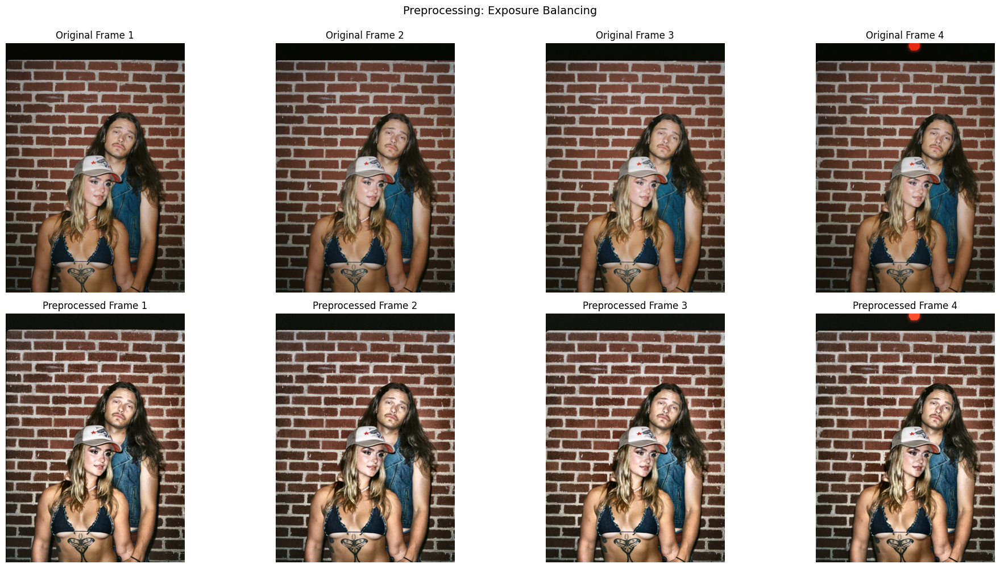

In [16]:
# Visualize preprocessing: original vs preprocessed
fig, axes = plt.subplots(2, len(images), figsize=(5*len(images), 10))

if len(images) == 1:
    axes = axes.reshape(-1, 1)

for i in range(len(images)):
    # Top row: original images
    axes[0, i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Original Frame {i+1}")
    axes[0, i].axis('off')
    
    # Bottom row: preprocessed images
    axes[1, i].imshow(cv2.cvtColor(preprocessed[i], cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Preprocessed Frame {i+1}")
    axes[1, i].axis('off')

plt.suptitle("Preprocessing: Exposure Balancing", fontsize=14, y=0.995)
plt.tight_layout()
plt.show()


## Segmentation and Mask Creation


In [17]:
# Visualize masks overlaid on images
# Check if required variables exist
if 'preprocessed' not in globals() or 'masks' not in globals():
    print("⚠ Error: 'preprocessed' or 'masks' not defined.")
    print("Please run the 'Segmentation and Mask Creation' cell first.")
else:
    def visualize_mask_overlay(img, mask, alpha=0.3, color=(0, 255, 0)):
        """Overlay a mask on an image with transparency."""
        overlay = img.copy()
        mask_bool = mask > 127
        overlay[mask_bool] = (
            (1 - alpha) * overlay[mask_bool] + 
            alpha * np.array(color)
        ).astype(np.uint8)
        return overlay
    
    # Ensure masks and preprocessed have the same length
    if len(preprocessed) != len(masks):
        print(f"⚠ Warning: Mismatch - {len(preprocessed)} preprocessed images but {len(masks)} masks")
        min_len = min(len(preprocessed), len(masks))
        preprocessed = preprocessed[:min_len]
        masks = masks[:min_len]
    
    fig, axes = plt.subplots(2, len(preprocessed), figsize=(5*len(preprocessed), 10))
    
    if len(preprocessed) == 1:
        axes = axes.reshape(-1, 1)
    
    # Top row: preprocessed images
    for i, (ax, img) in enumerate(zip(axes[0], preprocessed)):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"Frame {i+1} (Preprocessed)")
        ax.axis('off')
    
    # Bottom row: images with masks overlaid
    for i, (ax, img, mask) in enumerate(zip(axes[1], preprocessed, masks)):
        overlay = visualize_mask_overlay(img, mask, alpha=0.3, color=(0, 255, 0))
        ax.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        # Safely get method name - check if mask_methods exists and has enough elements
        if 'mask_methods' in globals() and i < len(mask_methods):
            method_name = mask_methods[i]
        elif 'SEGMENTATION_METHOD' in globals():
            method_name = SEGMENTATION_METHOD
        else:
            method_name = "unknown"
        ax.set_title(f"Frame {i+1} ({method_name})")
        ax.axis('off')
    
    # Get method name for title
    title_method = SEGMENTATION_METHOD if 'SEGMENTATION_METHOD' in globals() else "unknown"
    plt.suptitle(f"Subject Masks for Feature Detection (Method: {title_method})", fontsize=14, y=0.995)
    plt.tight_layout()
    plt.show()


⚠ Error: 'preprocessed' or 'masks' not defined.
Please run the 'Segmentation and Mask Creation' cell first.


In [ ]:
# Choose segmentation method
# Options: "opencv_dnn", "saliency", "grabcut", "center", or "auto"
# - "opencv_dnn": Uses OpenCV DNN with DeepLabV3 (requires model download, best quality)
# - "saliency": Uses OpenCV's built-in saliency detection (lightweight, no models)
# - "grabcut": Uses GrabCut with saliency initialization (good balance)
# - "center": Simple rectangular center mask (fastest, least accurate)
# - "auto": Automatically selects best available method
SEGMENTATION_METHOD = "saliency"  # Change this to try different methods

# Check if preprocessed images exist
if 'preprocessed' not in globals() or len(preprocessed) == 0:
    print("⚠ Error: 'preprocessed' images not found.")
    print("Please run the 'Preprocessing' cell first.")
else:
    # Import segmentation functions
    from nimslo_core.segmentation import segment_subject, get_segmentation_mask
    
    # Create masks using selected method
    masks = []
    mask_methods = []
    
    if SEGMENTATION_METHOD == "auto":
        # Use automatic method selection (prefers lightweight methods)
        for i, img in enumerate(preprocessed):
            mask, conf, method = get_segmentation_mask(img, prefer_lightweight=True)
            masks.append(mask)
            mask_methods.append(method)
            print(f"Frame {i+1}: {method} (confidence: {conf:.2f})")
    elif SEGMENTATION_METHOD == "center":
        # Fallback to simple center mask
        def create_center_mask(img, margin=0.15):
            """Create a mask covering the center region of the image."""
            h, w = img.shape[:2]
            mask = np.zeros((h, w), dtype=np.uint8)
            y1, y2 = int(h * margin), int(h * (1 - margin))
            x1, x2 = int(w * margin), int(w * (1 - margin))
            mask[y1:y2, x1:x2] = 255
            return mask
        
        for i, img in enumerate(preprocessed):
            mask = create_center_mask(img)
            masks.append(mask)
            mask_methods.append("center")
            print(f"Frame {i+1}: center mask")
    else:
        # Use specified segmentation method
        for i, img in enumerate(preprocessed):
            try:
                mask, conf = segment_subject(img, method=SEGMENTATION_METHOD, return_confidence=True)
                masks.append(mask)
                mask_methods.append(SEGMENTATION_METHOD)
                print(f"Frame {i+1}: {SEGMENTATION_METHOD} (confidence: {conf:.2f})")
            except Exception as e:
                print(f"Frame {i+1}: {SEGMENTATION_METHOD} failed ({e}), using center mask fallback")
                # Fallback to center mask
                h, w = img.shape[:2]
                mask = np.zeros((h, w), dtype=np.uint8)
                y1, y2 = int(h*0.2), int(h*0.8)
                x1, x2 = int(w*0.2), int(w*0.8)
                mask[y1:y2, x1:x2] = 255
                masks.append(mask)
                mask_methods.append("center_fallback")
    
    print(f"\n✓ Created {len(masks)} masks using method: {SEGMENTATION_METHOD}")


Frame 1: saliency (confidence: 0.30)
Frame 2: saliency (confidence: 0.30)
Frame 3: saliency (confidence: 0.30)
Frame 4: saliency (confidence: 0.30)

✓ Created 4 masks using method: saliency


## Compare Segmentation Methods


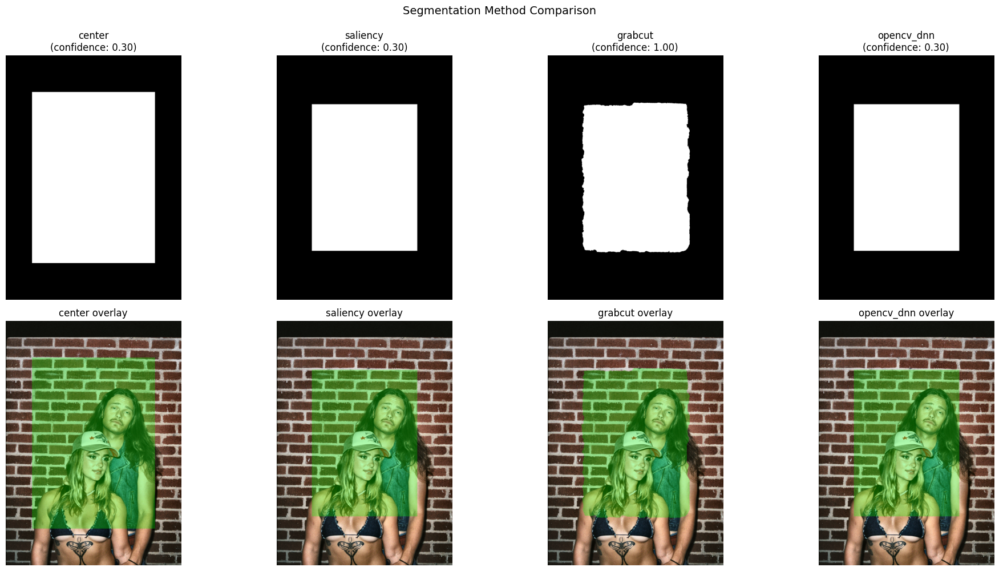


Comparison results:
  center: confidence = 0.30
  saliency: confidence = 0.30
  grabcut: confidence = 1.00
  opencv_dnn: confidence = 0.30


In [19]:
# Compare different segmentation methods on the first frame
# This helps you choose the best method for your images

test_img = preprocessed[0]
methods_to_compare = ["center", "saliency", "grabcut"]

# Try opencv_dnn if available
try:
    test_mask, test_conf = segment_subject(test_img, method="opencv_dnn", return_confidence=True)
    methods_to_compare.append("opencv_dnn")
except:
    print("Note: opencv_dnn not available (model may need download)")

# Create center mask function for comparison
def create_center_mask(img, margin=0.15):
    h, w = img.shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    y1, y2 = int(h * margin), int(h * (1 - margin))
    x1, x2 = int(w * margin), int(w * (1 - margin))
    mask[y1:y2, x1:x2] = 255
    return mask

# Generate masks for each method
comparison_masks = {}
comparison_confidences = {}

for method in methods_to_compare:
    try:
        if method == "center":
            mask = create_center_mask(test_img)
            conf = 0.3  # Low confidence for simple method
        else:
            mask, conf = segment_subject(test_img, method=method, return_confidence=True)
        comparison_masks[method] = mask
        comparison_confidences[method] = conf
    except Exception as e:
        print(f"Warning: {method} failed: {e}")

# Visualize comparison
n_methods = len(comparison_masks)
fig, axes = plt.subplots(2, n_methods, figsize=(5*n_methods, 10))

if n_methods == 1:
    axes = axes.reshape(-1, 1)

for idx, (method, mask) in enumerate(comparison_masks.items()):
    conf = comparison_confidences.get(method, 0.0)
    
    # Top row: masks only
    axes[0, idx].imshow(mask, cmap='gray')
    axes[0, idx].set_title(f"{method}\n(confidence: {conf:.2f})")
    axes[0, idx].axis('off')
    
    # Bottom row: masks overlaid on image
    overlay = visualize_mask_overlay(test_img, mask, alpha=0.3, color=(0, 255, 0))
    axes[1, idx].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[1, idx].set_title(f"{method} overlay")
    axes[1, idx].axis('off')

plt.suptitle("Segmentation Method Comparison", fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

print(f"\nComparison results:")
for method, conf in comparison_confidences.items():
    print(f"  {method}: confidence = {conf:.2f}")


## Feature Extraction and Matching


NameError: name 'kp1' is not defined

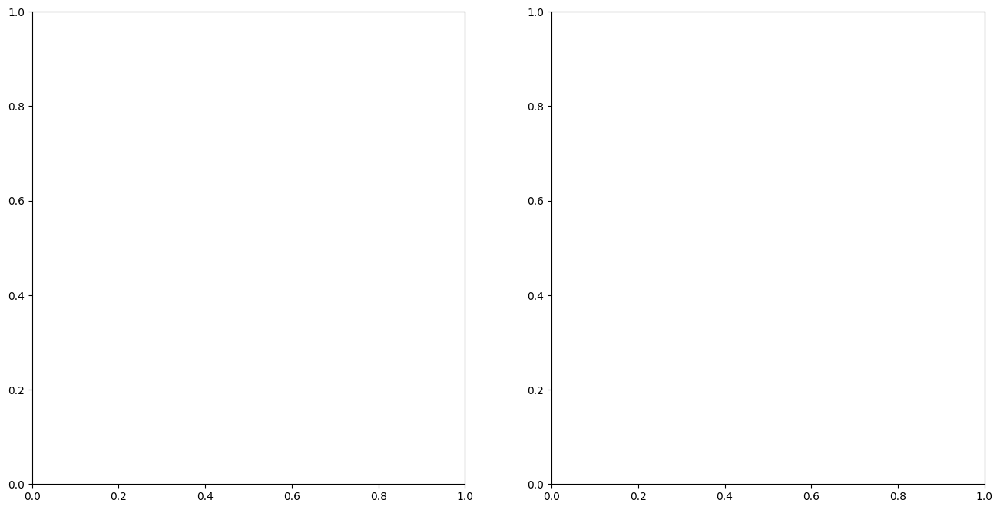

In [ ]:
# Visualize keypoints detected on each image
# Check if required variables exist
if 'kp1' not in globals() or 'kp2' not in globals() or 'preprocessed' not in globals():
    print("⚠ Error: 'kp1', 'kp2', or 'preprocessed' not defined.")
    print("Please run the 'Feature Extraction and Matching' cell first (the one that extracts features).")
else:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Frame 1: Show keypoints
    img1_kp = cv2.drawKeypoints(
        preprocessed[0], kp1, None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    axes[0].imshow(cv2.cvtColor(img1_kp, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Frame 1: {len(kp1)} keypoints")
    axes[0].axis('off')
    
    # Frame 2: Show keypoints
    img2_kp = cv2.drawKeypoints(
        preprocessed[1], kp2, None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    axes[1].imshow(cv2.cvtColor(img2_kp, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Frame 2: {len(kp2)} keypoints")
    axes[1].axis('off')
    
    plt.suptitle("SIFT Feature Keypoints Detection", fontsize=14)
    plt.tight_layout()
    plt.show()


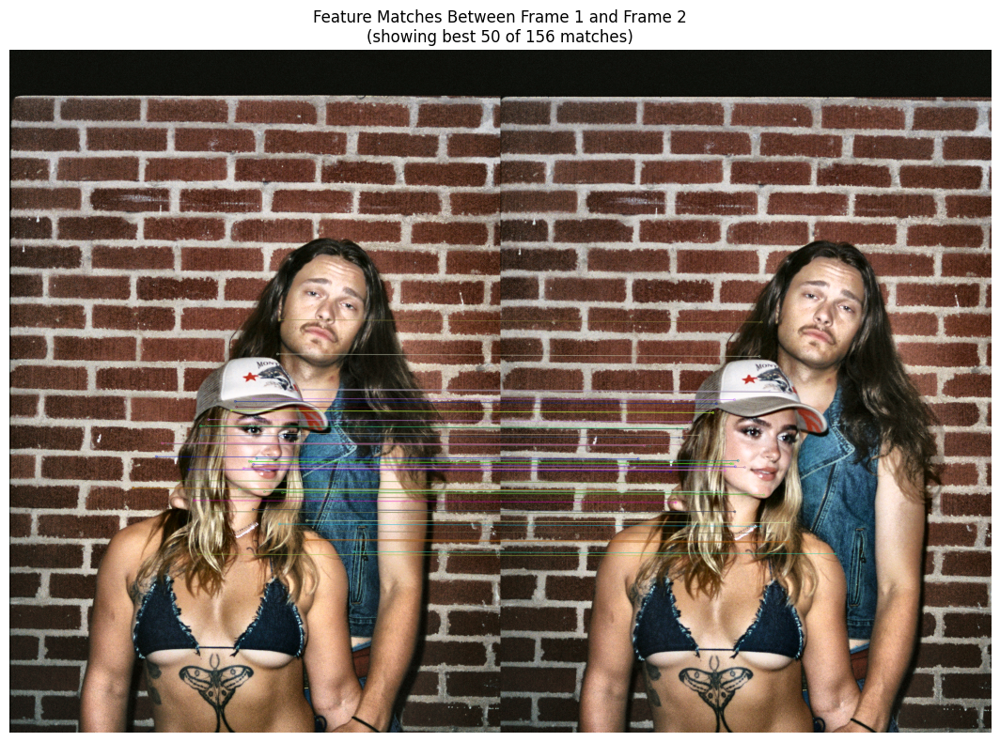

In [ ]:
# Visualize feature matches between frames
# Check if required variables exist
if 'matches' not in globals() or 'kp1' not in globals() or 'kp2' not in globals() or 'preprocessed' not in globals():
    print("⚠ Error: 'matches', 'kp1', 'kp2', or 'preprocessed' not defined.")
    print("Please run the 'Feature Extraction and Matching' cell first (the one that extracts features).")
elif len(matches) > 0:
    # Sort by distance to show best matches first
    sorted_matches = sorted(matches, key=lambda x: x.distance)
    
    img_matches = cv2.drawMatches(
        preprocessed[0], kp1,
        preprocessed[1], kp2,
        sorted_matches[:50],  # Show best 50 matches
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title(f"Feature Matches Between Frame 1 and Frame 2\n(showing best {min(50, len(matches))} of {len(matches)} matches)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("⚠ No matches found!")


In [ ]:
# Extract features from first two frames
kp1, des1 = extract_features(preprocessed[0], mask=masks[0], n_features=1000)
kp2, des2 = extract_features(preprocessed[1], mask=masks[1], n_features=1000)

print(f"Frame 1: {len(kp1)} keypoints")
print(f"Frame 2: {len(kp2)} keypoints")

# Match features
matches = match_features(des1, des2)
print(f"✓ Found {len(matches)} matches")


Frame 1: 486 keypoints
Frame 2: 451 keypoints
✓ Found 258 matches


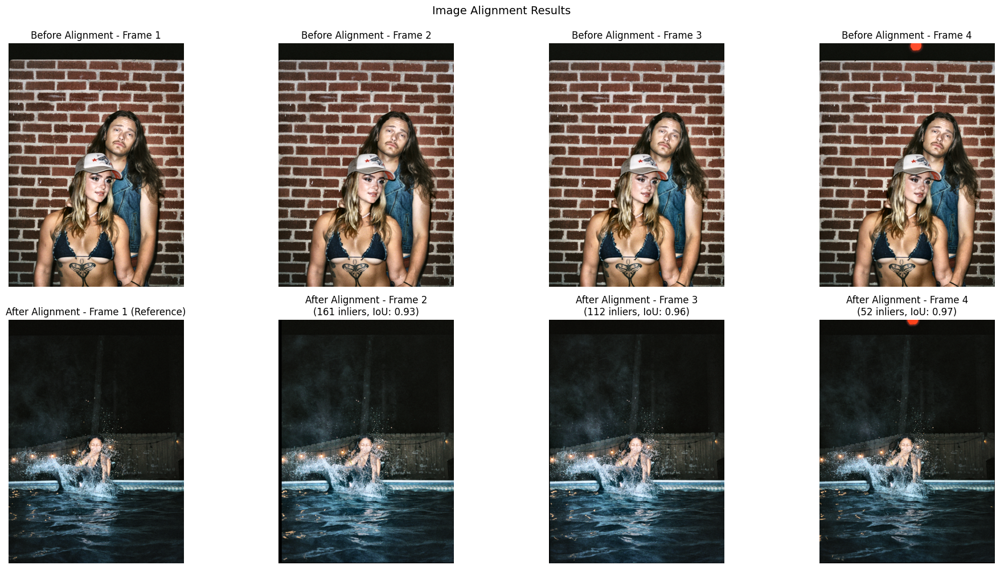

In [ ]:
# Visualize alignment: before vs after
fig, axes = plt.subplots(2, len(preprocessed), figsize=(5*len(preprocessed), 10))

if len(preprocessed) == 1:
    axes = axes.reshape(-1, 1)

# Top row: original preprocessed images (before alignment)
for i, (ax, img) in enumerate(zip(axes[0], preprocessed)):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Before Alignment - Frame {i+1}")
    ax.axis('off')

# Bottom row: aligned images
for i, (ax, img) in enumerate(zip(axes[1], aligned_images)):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if i == 0:
        title = f"After Alignment - Frame {i+1} (Reference)"
    else:
        result = alignment_results[i]
        title = f"After Alignment - Frame {i+1}\n({result.inliers} inliers, IoU: {result.iou:.2f})"
    ax.set_title(title)
    ax.axis('off')

plt.suptitle("Image Alignment Results", fontsize=14, y=0.995)
plt.tight_layout()
plt.show()


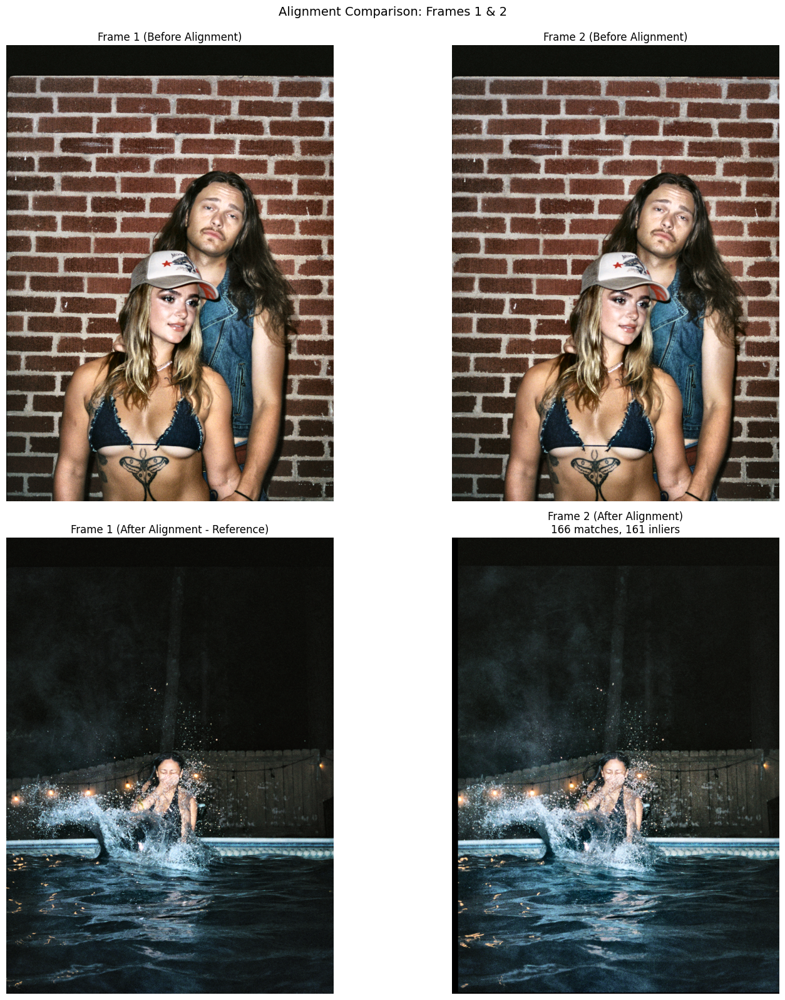

In [ ]:
# Side-by-side comparison of first two frames before and after alignment
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

# Before alignment
axes[0, 0].imshow(cv2.cvtColor(preprocessed[0], cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Frame 1 (Before Alignment)")
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(preprocessed[1], cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Frame 2 (Before Alignment)")
axes[0, 1].axis('off')

# After alignment
axes[1, 0].imshow(cv2.cvtColor(aligned_images[0], cv2.COLOR_BGR2RGB))
axes[1, 0].set_title("Frame 1 (After Alignment - Reference)")
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(aligned_images[1], cv2.COLOR_BGR2RGB))
result = alignment_results[1]
axes[1, 1].set_title(f"Frame 2 (After Alignment)\n{result.total_matches} matches, {result.inliers} inliers")
axes[1, 1].axis('off')

plt.suptitle("Alignment Comparison: Frames 1 & 2", fontsize=14, y=0.995)
plt.tight_layout()
plt.show()


## Image Alignment


In [ ]:
# Align all images to the first frame
aligned_images, alignment_results = align_images(
    preprocessed, 
    masks,
    n_features=1000
)

print("Alignment results:")
for i, result in enumerate(alignment_results):
    if i > 0:  # Skip reference frame
        print(f"Frame {i+1}: {result.total_matches} matches, {result.inliers} inliers, IoU: {result.iou:.2f}")

print("✓ Images aligned")


Alignment results:
Frame 2: 263 matches, 155 inliers, IoU: 0.94
Frame 3: 206 matches, 75 inliers, IoU: 0.89
Frame 4: 217 matches, 77 inliers, IoU: 0.84
✓ Images aligned


## Generate Boomerang GIF


In [ ]:
# Optionally resize for web-friendly output
from nimslo_core.gif_generator import resize_for_web
aligned_for_gif = resize_for_web(aligned_images, max_dimension=600)

# Create boomerang GIF
output_path = OUTPUT_DIR / f"workbook_{BATCH_NAME}.gif"
gif_path = create_boomerang_gif(
    aligned_for_gif,
    output_path,
    crop_valid_region=True,
    normalize_brightness=True,
    brightness_strength=0.5
)

print(f"✓ GIF saved to: {gif_path}")
print(f"  File size: {gif_path.stat().st_size / 1024:.1f} KB")


✓ GIF saved to: ../outputs/workbook_01.gif
  File size: 1330.0 KB


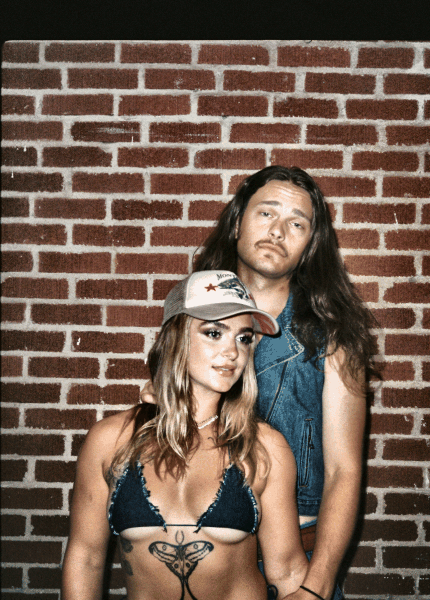

In [ ]:
# Display the GIF
from IPython.display import Image, display
display(Image(str(gif_path)))
